In [1]:
import os
import shutil
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from models import basemodel, non_norm
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd
import seaborn as sns


2023-10-01 01:57:18.170282: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-01 01:57:18.281127: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-01 01:57:18.312026: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-01 01:57:18.845640: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
def train(
    model, X, Y,
    test_X, test_Y, 
    # callback,
    Epoch = 50,
    learning_rate = 1e-3,
    cp_path = None,
    q = None,
    ):
    callback = tf.keras.callbacks.ModelCheckpoint(
        filepath = './model/' + cp_path,
        monitor='val_accuracy',
        mode='max',
        save_best_only = True,
        save_weigths_only = False,
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate = learning_rate)
    loss = tf.keras.losses.CategoricalCrossentropy()
    model.compile(optimizer = optimizer , loss = loss, 
                metrics = ['accuracy', 'categorical_crossentropy'])
    print('X shape : ', X.shape)
    model.build(input_shape = (1, X.shape[1]))          
    model.summary()
    history = model.fit(X, Y,  epochs = Epoch,
                validation_data = (test_X, test_Y),
                callbacks = [callback]
                )
    model = tf.keras.models.load_model(('./model/'+cp_path))
    y_pred = np.argmax(model.predict(test_X), axis = 1)
    y_gt = np.argmax(test_Y, axis = 1)
    score = accuracy_score(y_gt, y_pred)
    print('Best score : {:.4f}'.format(score))

    # Y_pred_label = np.array([idx2label_Dict[y_pred[i]] for i in range(len(y_pred))])
    # Y_gt_label = np.array([idx2label_Dict[y_gt[i]] for i in range(len(y_gt))])
    # cm = confusion_matrix(Y_gt_label, Y_pred_label)
    # label = ['Asphalt', 'Brick', 'Tile', 'Sandbed', 'Urethane']
    # heatmap(cm, 'Road_surface_classification', label)
    return history

# def heatmap(matrix, title, label):
#     save_path = 'plot/cm.png'
#     df=pd.DataFrame(matrix, index = label, columns = label)
#     plt.figure(figsize=(10,10))
#     sns.heatmap(df, annot=True, fmt = 'd')
#     plt.tick_params(axis='x', top=True, labeltop = True,bottom=False, labelbottom=False)
#     plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns)
#     plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
#     plt.xlabel("Prediction",position = (0.5,1.0+0.05))
#     plt.ylabel("Ground Truth")
#     plt.title(title)
#     plt.savefig('cm.png', format='png', dpi=300)

In [3]:
def createFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)

In [4]:
def file_sort(path):
    file_list = os.listdir(path)
    for file in file_list:
        if os.path.isfile(os.path.join(path, file)):
            createFolder('./'+path+'/' + file[:2])
            shutil.move('./'+path+'/' + file, './'+path+'/' + file[:2] + '/' + file)

In [5]:
def file_load(path):
    data = list()
    file_list = os.listdir(path)
    for file in file_list:
        file_path = os.path.join(path,file)
        if os.path.isfile(file_path):
            temp = np.load(file_path)
            data.append(temp)
    return data

In [6]:
folder_path = './counting'

In [7]:
folder_list = os.listdir(folder_path)

In [8]:
folder_list = sorted(folder_list)

In [9]:
temp_path = os.path.join(folder_path,folder_list[1])
data = file_load(temp_path)

In [10]:
data_dict = dict()
for folder in folder_list:
    temp_path = os.path.join(folder_path,folder)
    data_dict[folder] = np.array(file_load(temp_path))

In [11]:
reshaped_data = dict()
for i in data_dict.keys():
    reshaped_data[i] = data_dict[i].reshape(data_dict[i].shape[0]*data_dict[i].shape[1], data_dict[i].shape[2], data_dict[i].shape[3])
    reshaped_data[i] = reshaped_data[i].reshape(reshaped_data[i].shape[0], reshaped_data[i].shape[2])

In [12]:
reshaped_data['00'].shape

(120, 301)

In [13]:
range_fft_dict= dict()
for i in reshaped_data.keys():
    range_fft_dict[i] = np.fft.fftshift(np.fft.fft(reshaped_data[i], axis=1), axes=1)

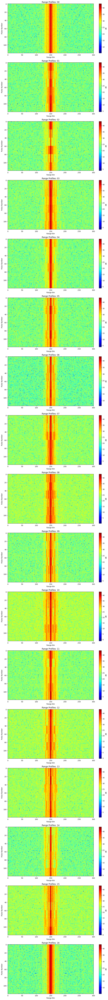

In [14]:
# 서브플롯 그리기
num_profiles = len(range_fft_dict)
plt.figure(figsize=(10, 5 * num_profiles))

for idx, (key, profile) in enumerate(range_fft_dict.items(), 1):
    plt.subplot(num_profiles, 1, idx)
    plt.imshow(10 * np.log10(np.abs(profile)), aspect='auto', cmap='jet', interpolation='none')
    # plt.imshow(np.abs(profile), aspect='auto', cmap='jet', interpolation='none')
    plt.colorbar(label="dB")
    plt.xlabel("Range Bin")
    plt.ylabel("Pulse Number")
    plt.title(f"Range Profiles: {key}")

plt.tight_layout()
plt.show()

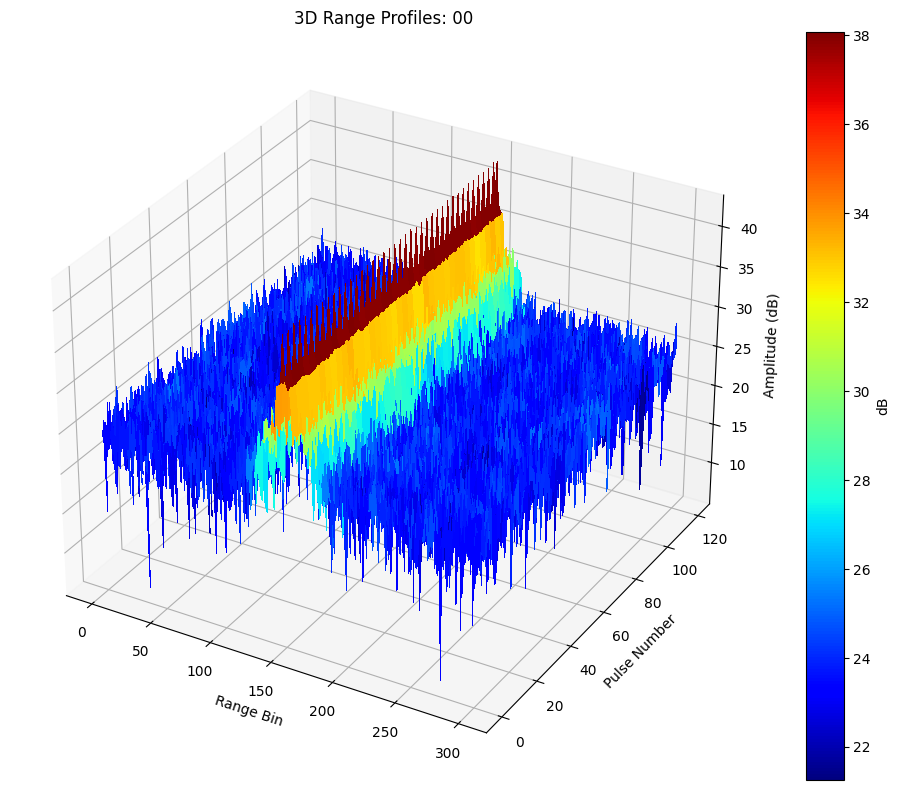

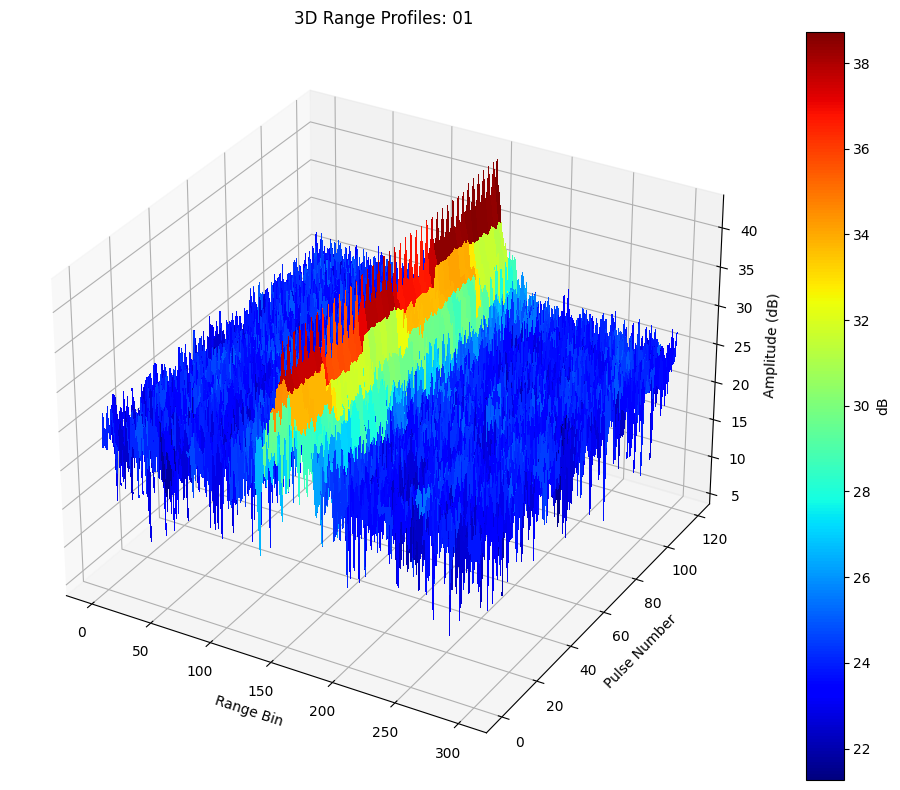

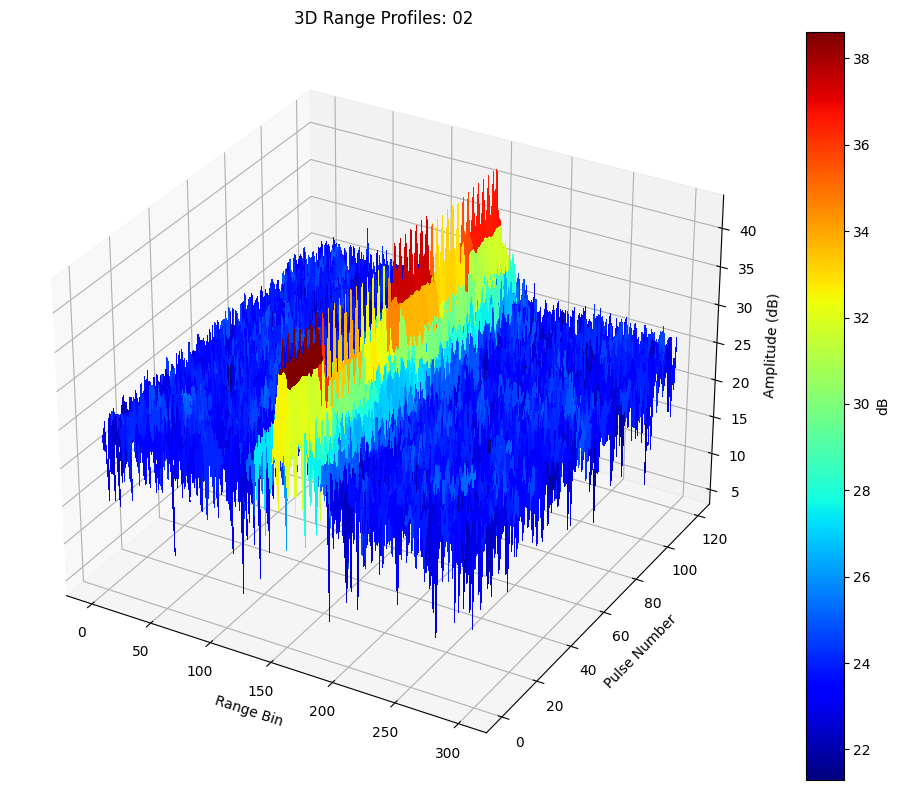

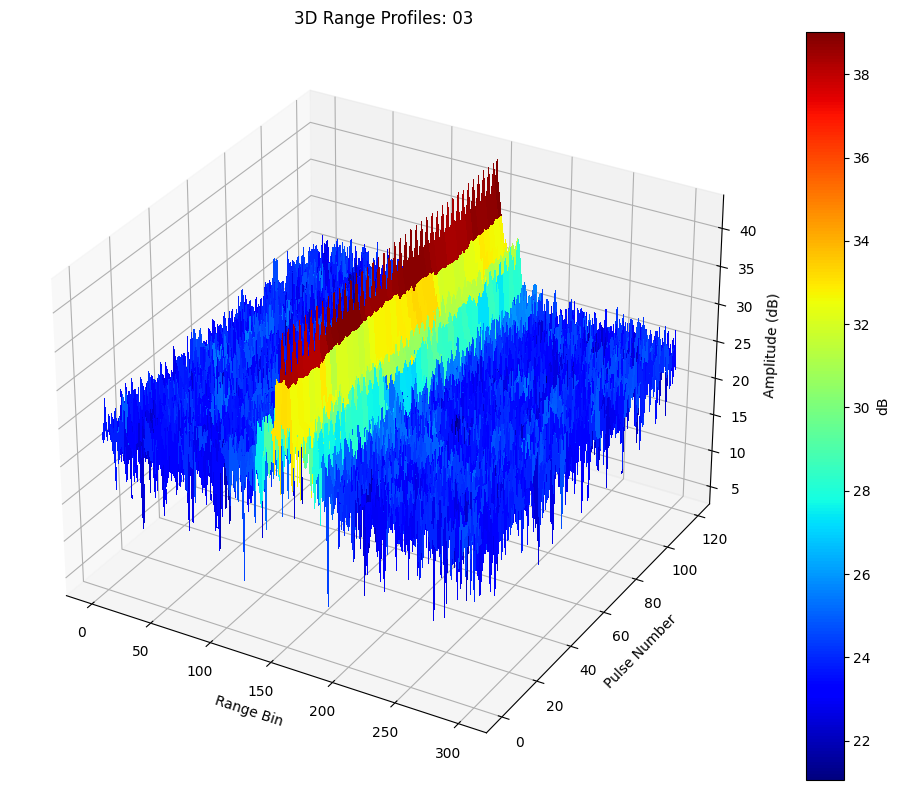

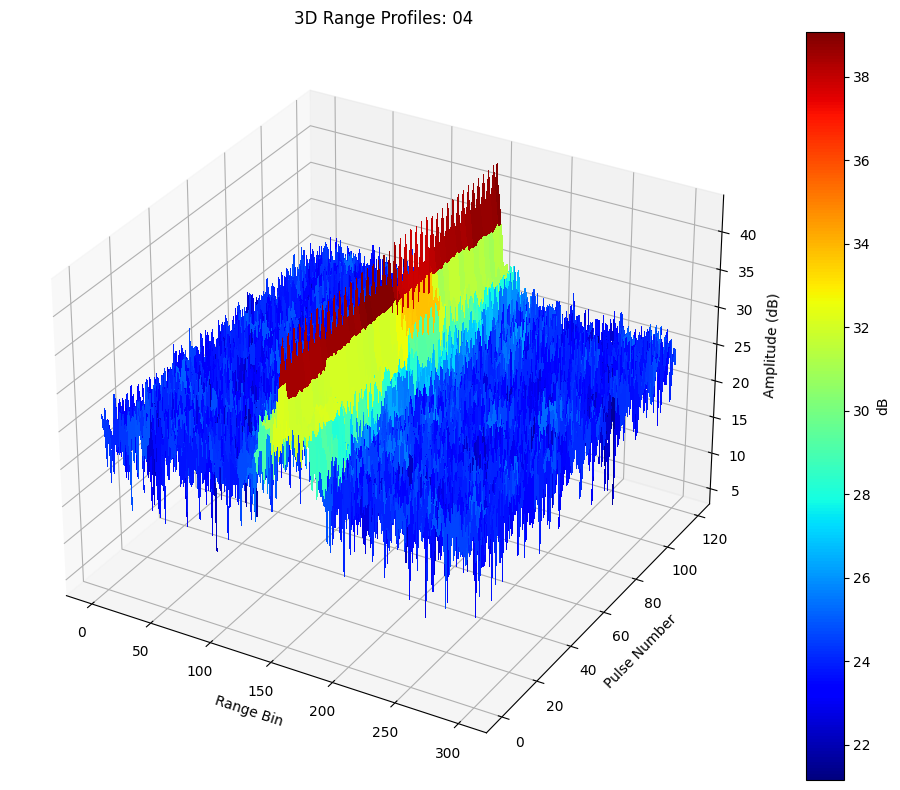

...

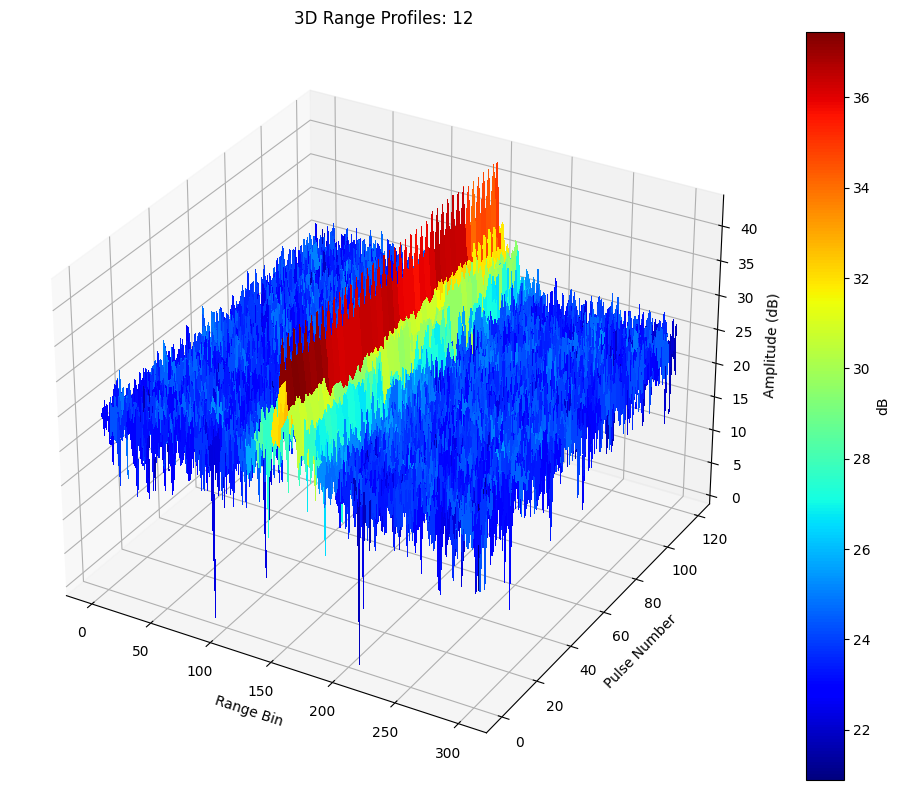

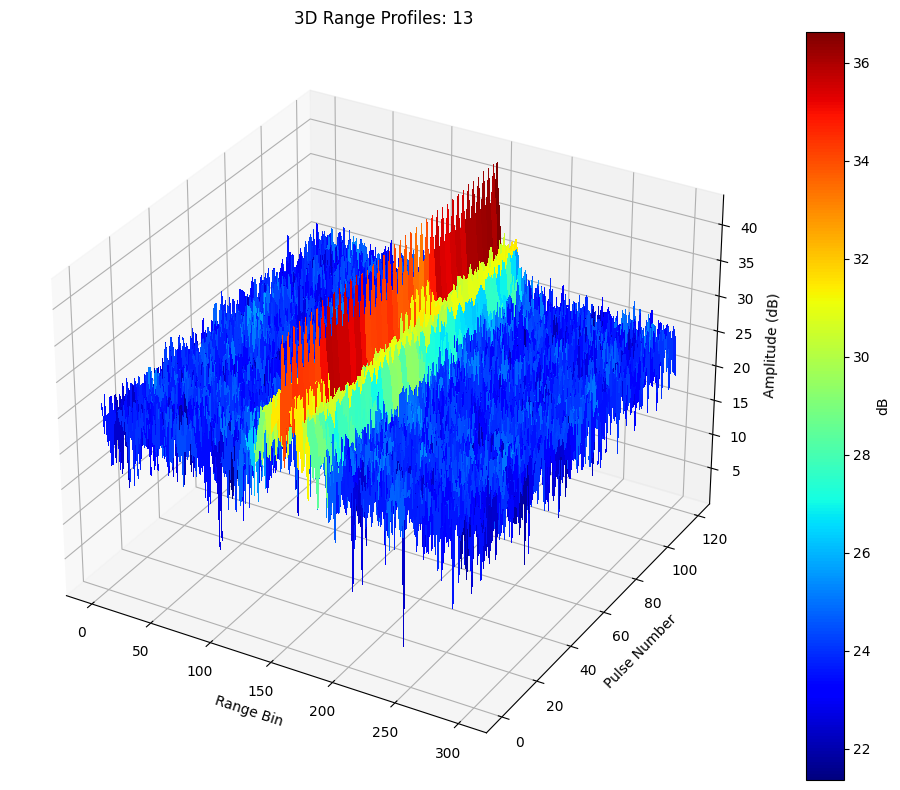

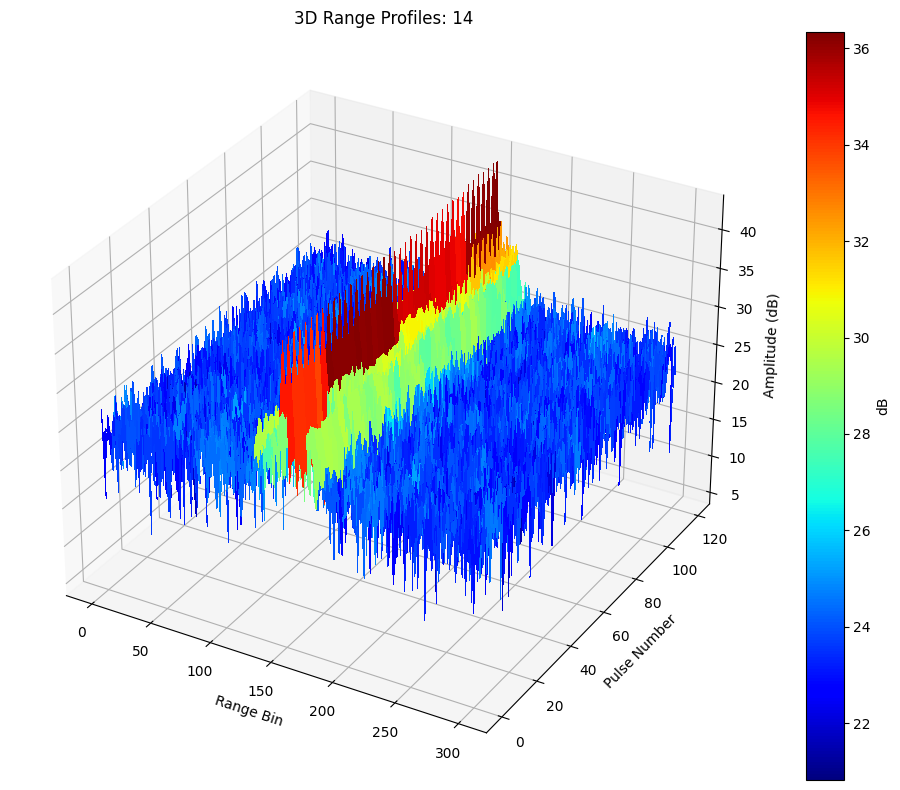

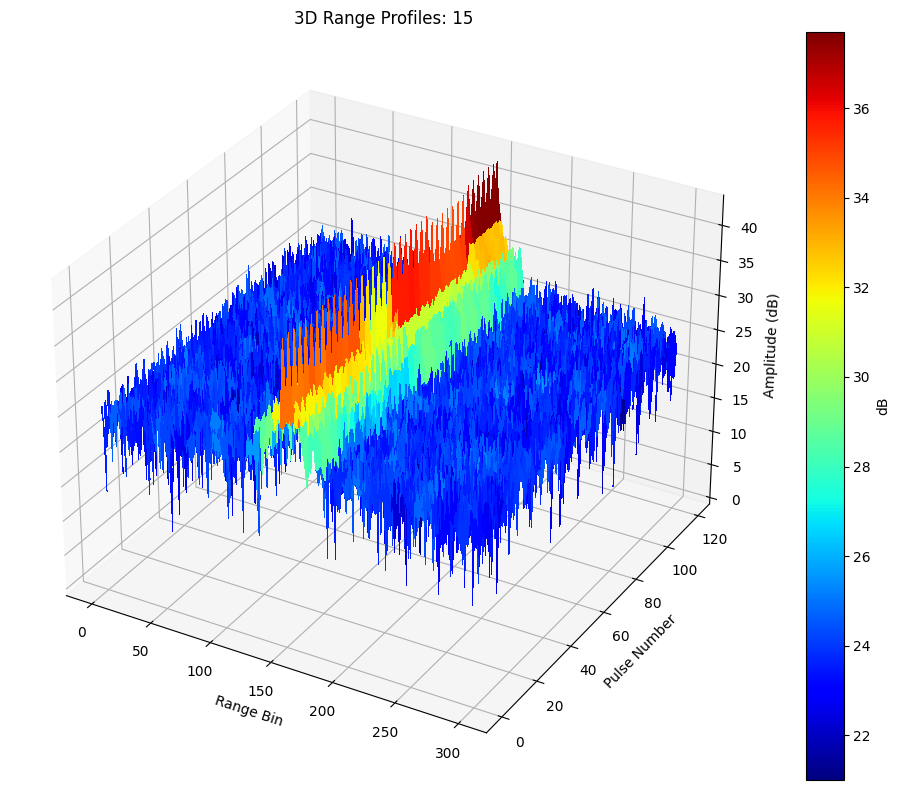

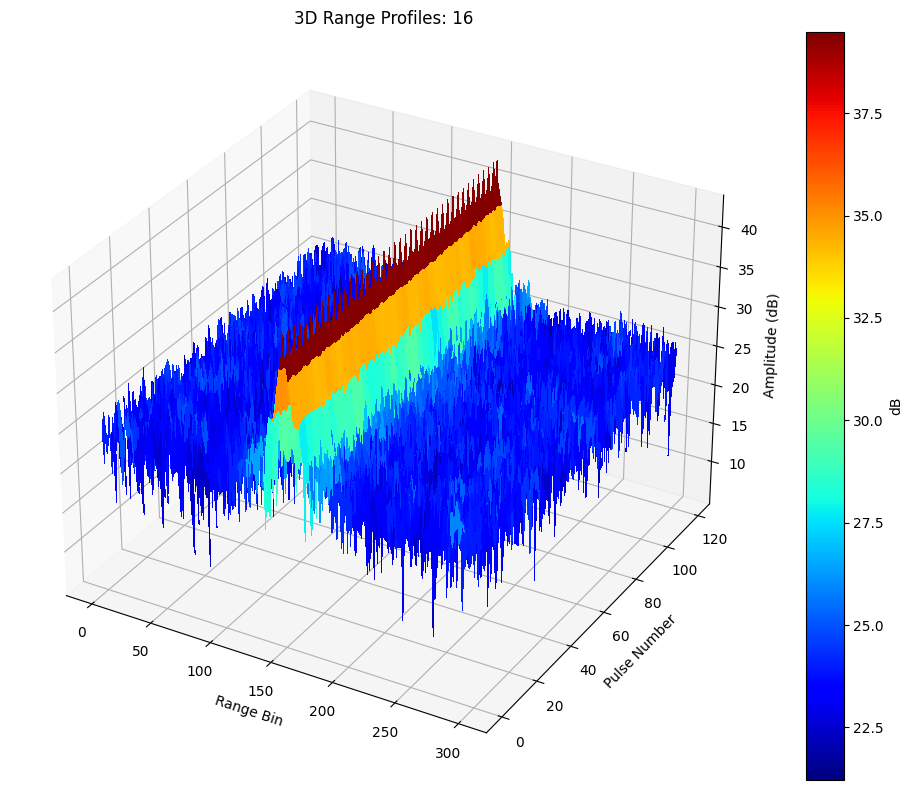

In [15]:
# 그래프 그리기
num_profiles = len(range_fft_dict)

for idx, (key, profile) in enumerate(range_fft_dict.items(), 1):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    X = np.arange(profile.shape[1])  # Range Bin
    Y = np.arange(profile.shape[0])  # Pulse Number
    X, Y = np.meshgrid(X, Y)
    Z = 10 * np.log10(np.abs(profile))
    
    surf = ax.plot_surface(X, Y, Z, cmap='jet', linewidth=0, antialiased=False)
    
    ax.set_xlabel("Range Bin")
    ax.set_ylabel("Pulse Number")
    ax.set_zlabel("Amplitude (dB)")
    ax.set_title(f"3D Range Profiles: {key}")
    fig.colorbar(surf, ax=ax, label="dB")

    plt.tight_layout()
    plt.show()

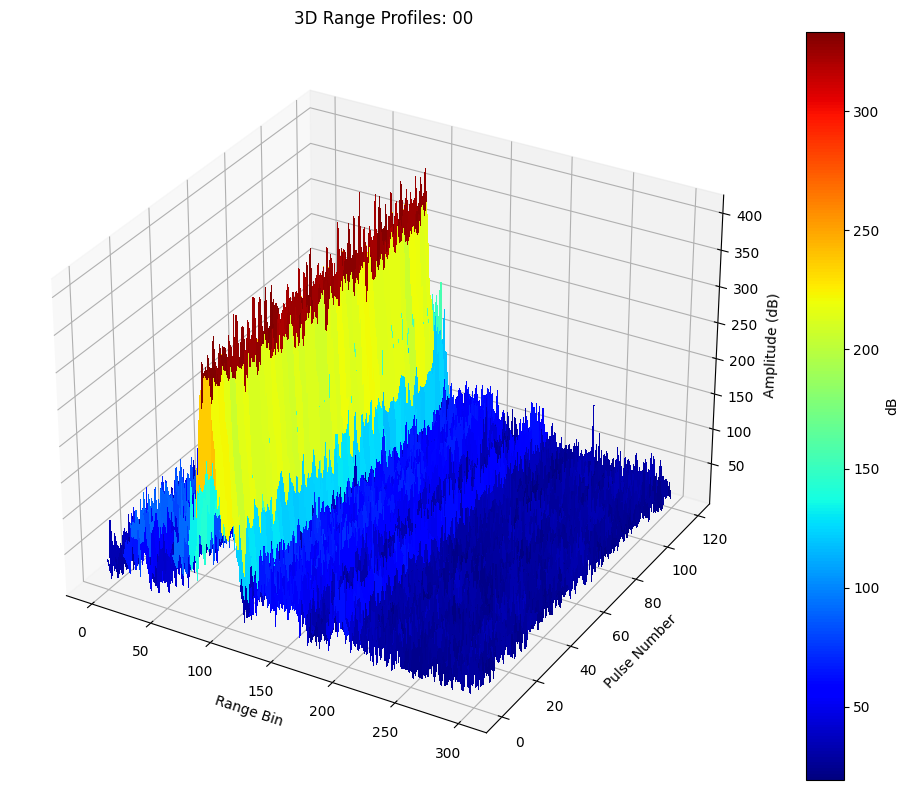

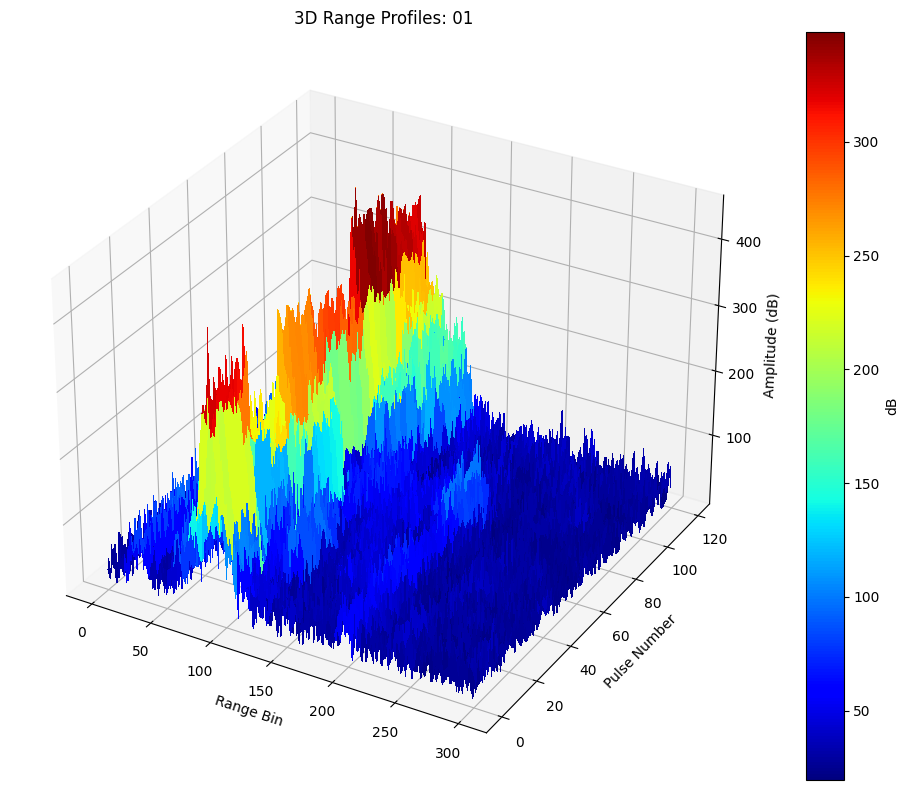

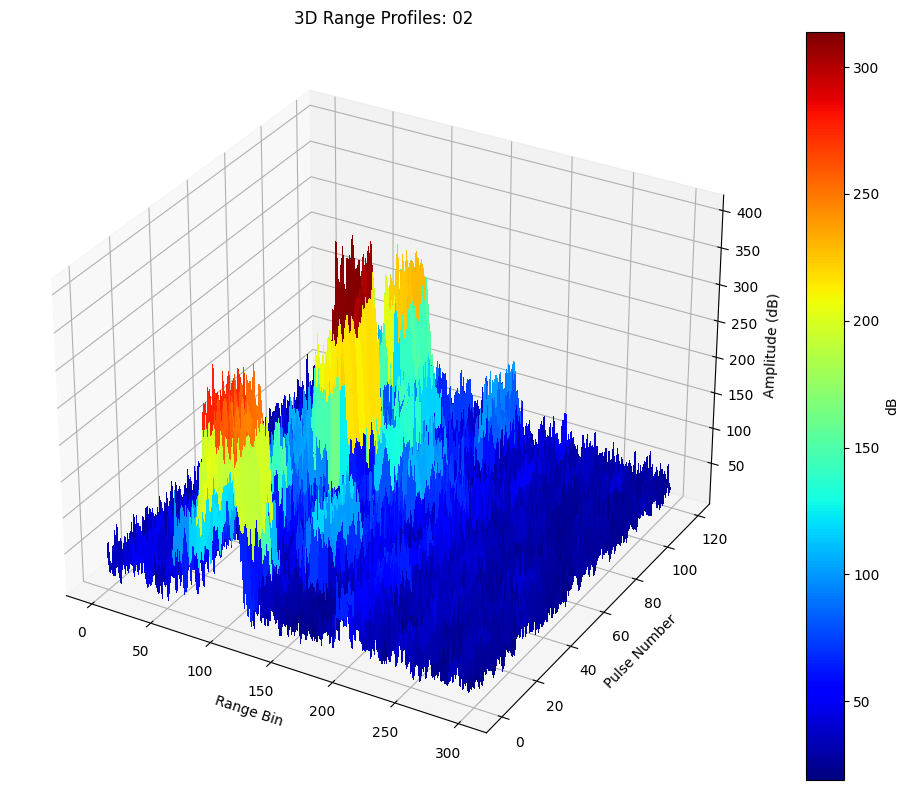

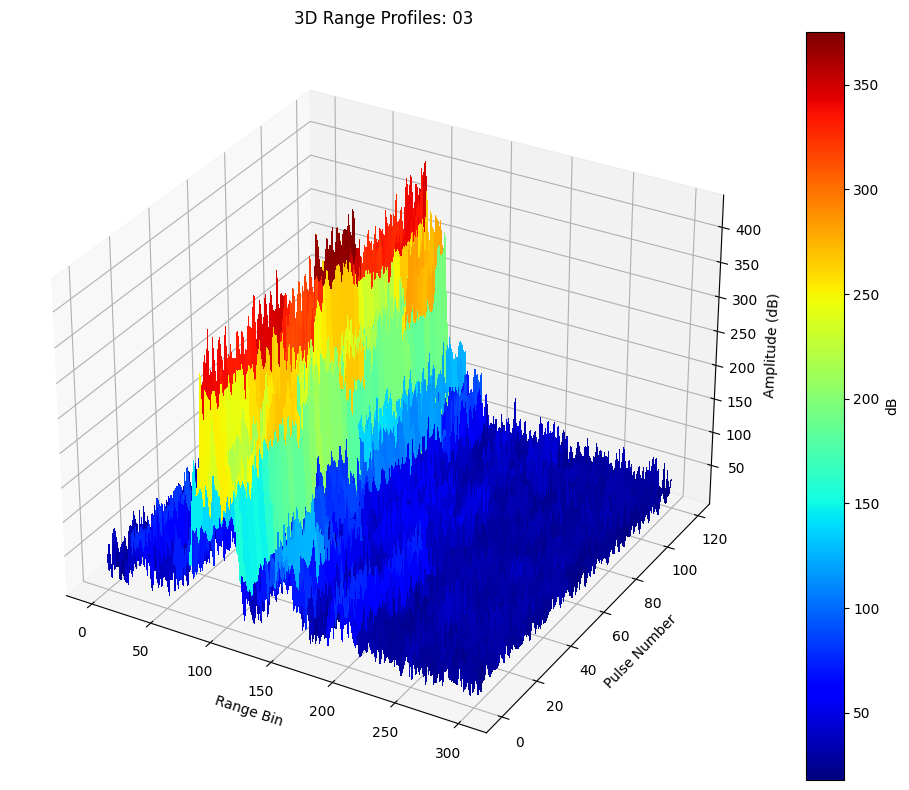

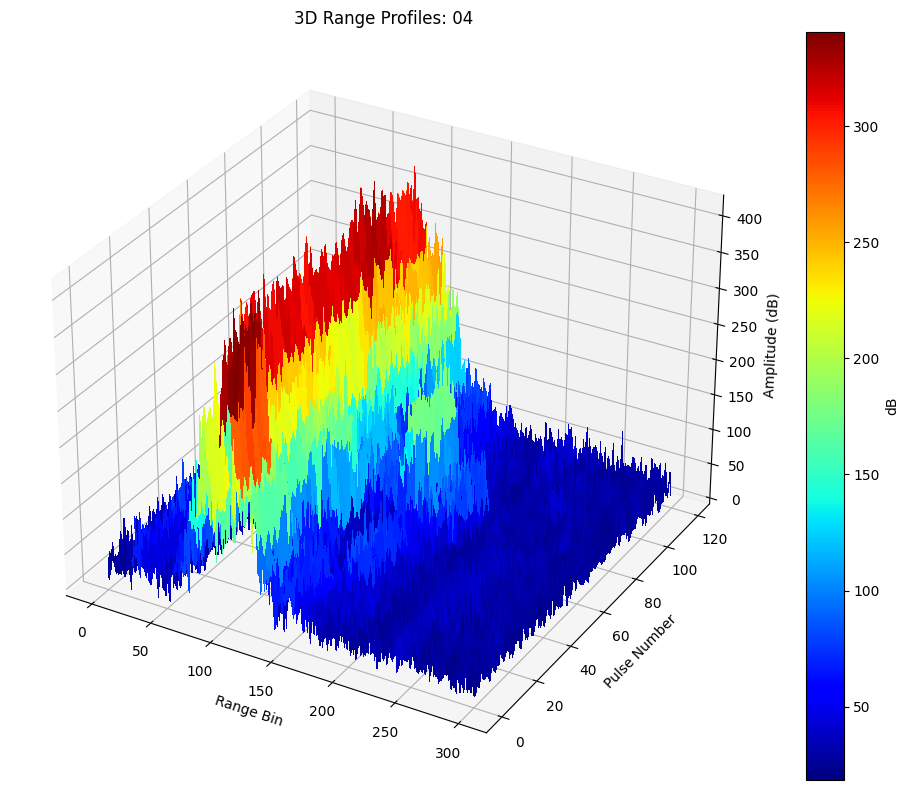

...

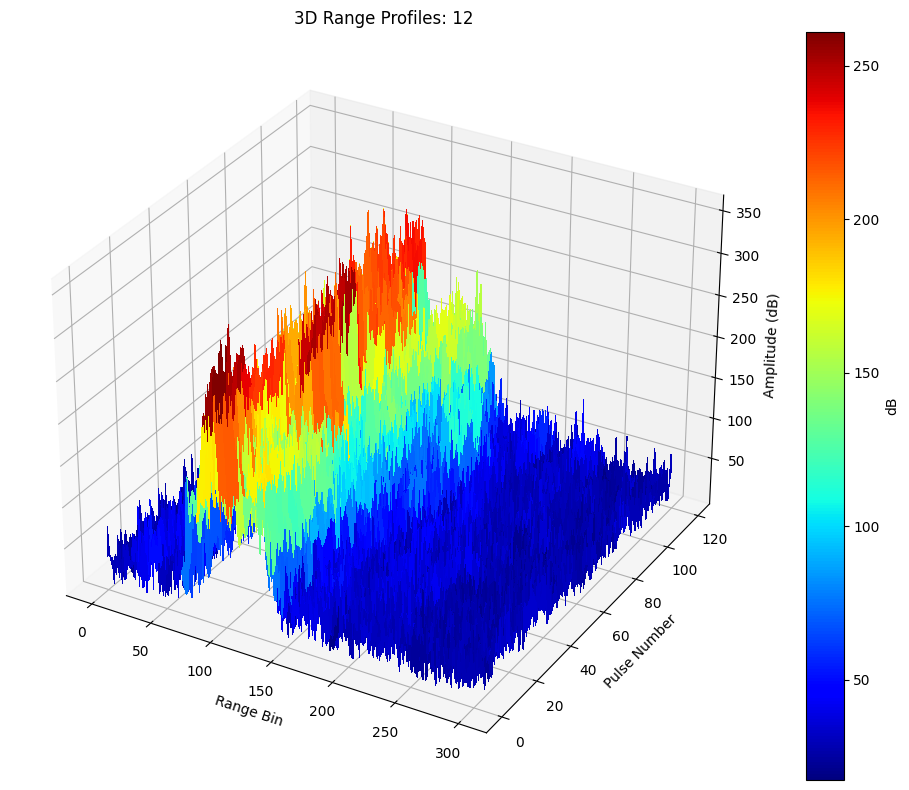

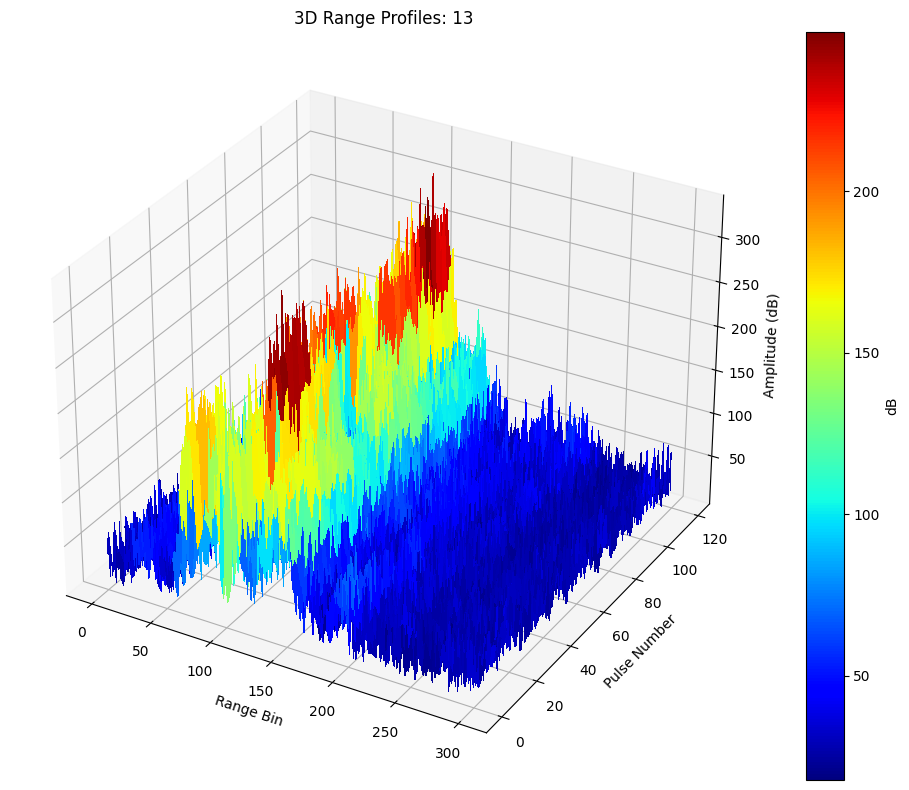

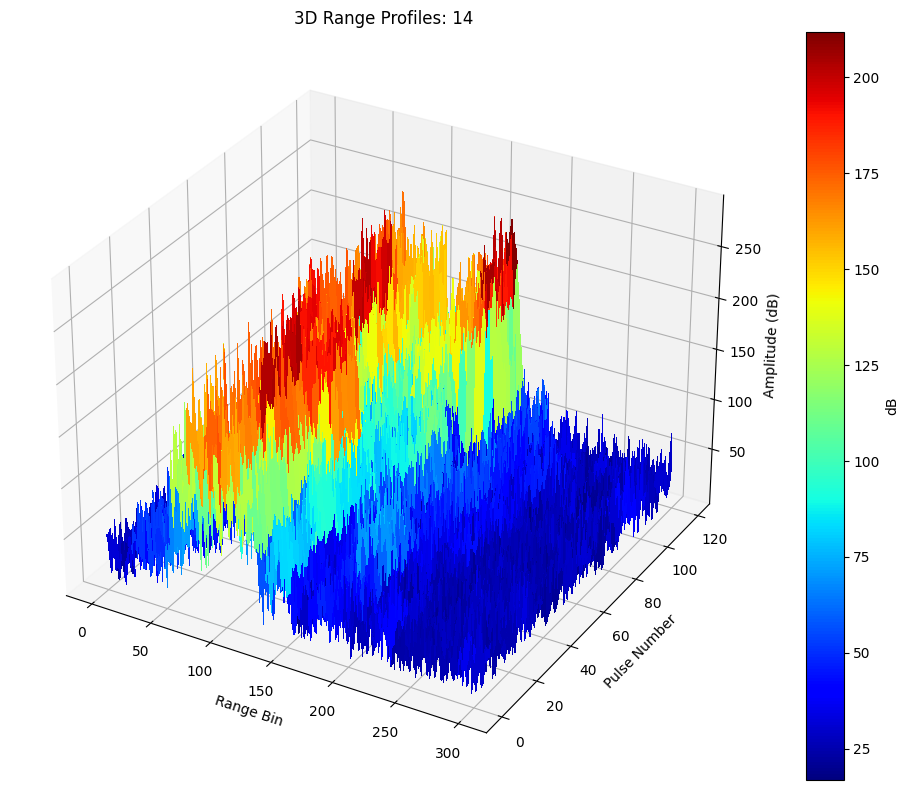

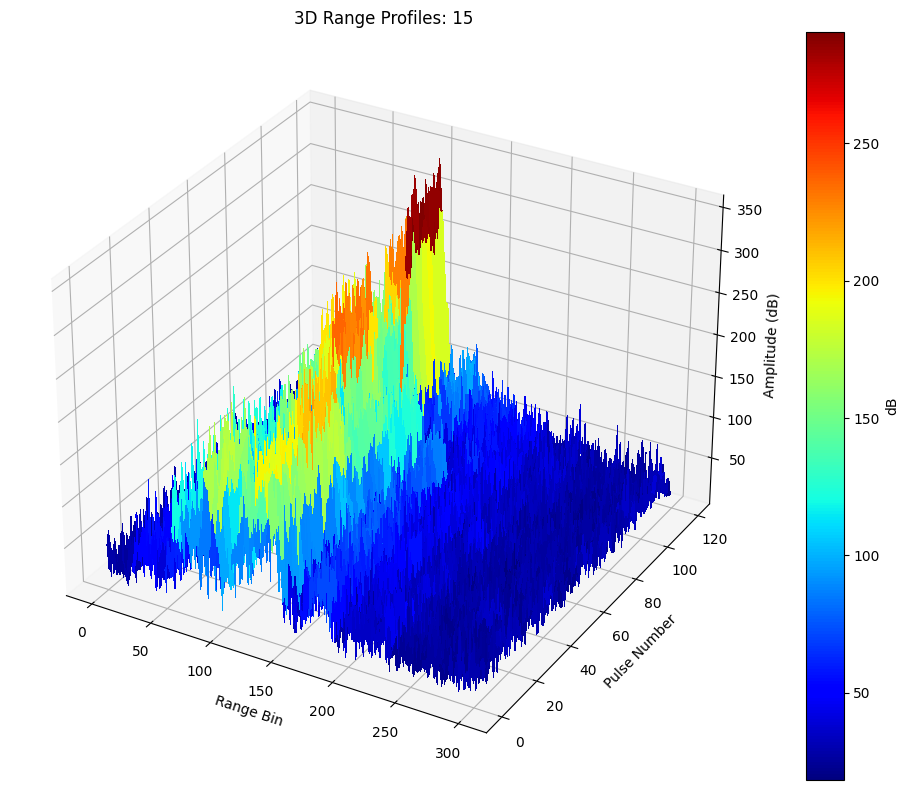

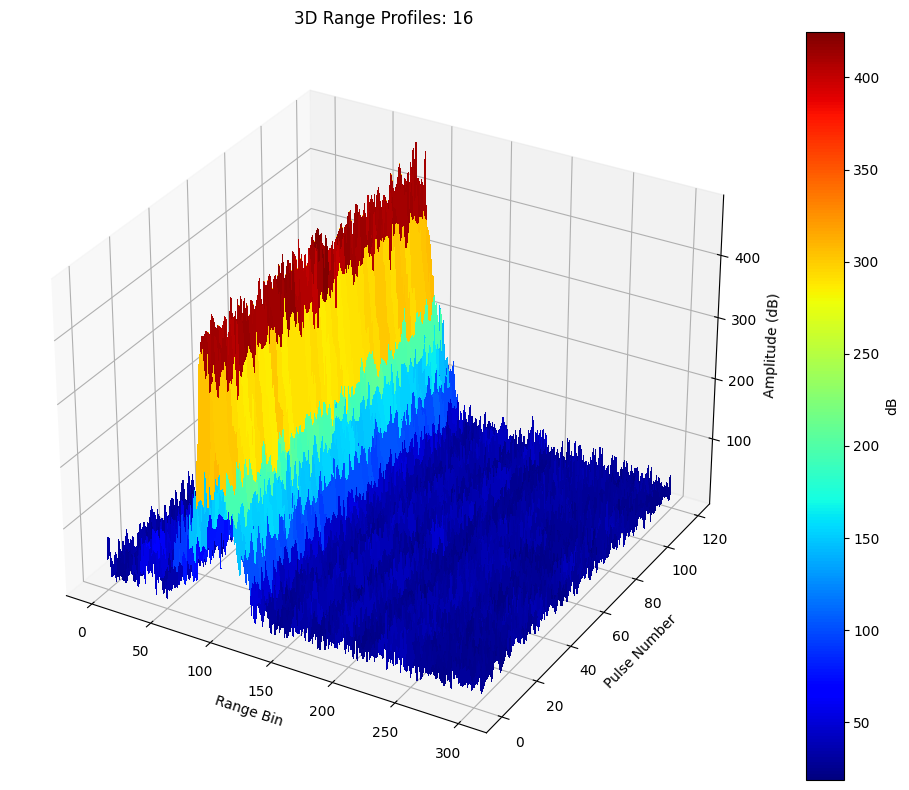

In [16]:
num_profiles = len(reshaped_data)

for idx, (key, profile) in enumerate(reshaped_data.items(), 1):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    X = np.arange(profile.shape[1])  # Range Bin
    Y = np.arange(profile.shape[0])  # Pulse Number
    X, Y = np.meshgrid(X, Y)
    # Z = 10 * np.log10(np.abs(profile))
    Z = np.abs(profile)
    
    surf = ax.plot_surface(X, Y, Z, cmap='jet', linewidth=0, antialiased=False)
    
    ax.set_xlabel("Range Bin")
    ax.set_ylabel("Pulse Number")
    ax.set_zlabel("Amplitude (dB)")
    ax.set_title(f"3D Range Profiles: {key}")
    fig.colorbar(surf, ax=ax, label="dB")

    plt.tight_layout()
    plt.show()

In [17]:
# model = basemodel(len(range_fft_dict))

In [18]:
def make_dataset(data_dict):
    x = list()
    y = list()
    for key, data in data_dict.items():
        x.append(data)
        for i in range(data.shape[0]):
            y.append(to_categorical(int(key), num_classes=len(data_dict)))
    x = np.array(x)
    x = x.reshape(x.shape[0]*x.shape[1], x.shape[2])
    y = np.array(y)
    X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.2, random_state=42)
    return X_train, X_test, Y_train, Y_test

In [19]:
X_train, X_test, Y_train, Y_test = make_dataset(range_fft_dict)

In [20]:
non_norm_model = non_norm(len(range_fft_dict))
history = train(model = non_norm_model, X = X_train, Y = Y_train, test_X = X_test, test_Y = Y_test, cp_path = 'fft_counting_non_norm', Epoch=1000)

2023-10-01 01:57:34.818918: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-01 01:57:36.758927: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 18532 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:3b:00.0, compute capability: 8.6
2023-10-01 01:57:36.759682: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22288 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:5e:00.0, compute capability: 8.6
2023-10-01 01:57:36.760270: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localho

X shape :  (1632, 301)
Model: "non_norm"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               multiple                  2416      
                                                                 
 batch_normalization (BatchN  multiple                 32        
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             multiple                  144       
                                                                 
 dense_2 (Dense)             multiple                  544       
                                                                 
 dense_3 (Dense)             multiple                  561       
                                                                 
Total params: 3,697
Trainable params: 3,681
Non-trainable params: 16
________________________________

2023-10-01 01:57:38.972943: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


51/51 [==============================] - 3s 26ms/step - loss: 2.7460 - accuracy: 0.1121 - categorical_crossentropy: 2.7460 - val_loss: 2.9254 - val_accuracy: 0.0686 - val_categorical_crossentropy: 2.9254
Epoch 2/1000
51/51 [==============================] - 1s 20ms/step - loss: 2.4541 - accuracy: 0.2022 - categorical_crossentropy: 2.4541 - val_loss: 2.5881 - val_accuracy: 0.1078 - val_categorical_crossentropy: 2.5881
Epoch 3/1000
51/51 [==============================] - 1s 22ms/step - loss: 2.0567 - accuracy: 0.3425 - categorical_crossentropy: 2.0567 - val_loss: 2.2078 - val_accuracy: 0.3088 - val_categorical_crossentropy: 2.2078
Epoch 4/1000
51/51 [==============================] - 1s 21ms/step - loss: 1.6147 - accuracy: 0.4761 - categorical_crossentropy: 1.6147 - val_loss: 1.8352 - val_accuracy: 0.3750 - val_categorical_crossentropy: 1.8352
Epoch 5/1000
51/51 [==============================] - 1s 20ms/step - loss: 1.2945 - accuracy: 0.5650 - categorical_crossentropy: 1.2945 - val_los

In [21]:
non_norm_model = non_norm(len(range_fft_dict))